In [1]:
from tkinter.scrolledtext import example
import faceNetArchitectures
import tensorflow as tf
import cv2
from tensorflow.keras.models import load_model as tf_load
import matplotlib.pyplot as plt
import os 
import sys
sys.path.append("..//utils/")
from slp_utils_XL import crop_from_com
from triangulation_utils import unDistortPoints, camera_matrix, triangulate_confThresh_lowestErr
sys.path.append("..//camera_calibration/")
import pySBA
import mat73
import numpy as np

In [2]:
''' load the training images and faceNet model '''
# set up GPUs
gpu = 0
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_visible_devices(gpus[gpu],'GPU')

# Label3D training data
training_dir = r'Z:/Sherry/poseTrackingXL/training_files/Label3D/'
training_files = []
for f in os.listdir(training_dir):
    if 'ROS108_062526_nf5testnFrame50_v73_videos.mat' in f:
        training_files.append(f)
# single-view RGB classifier, input (128, 128, 3), 3-class softmax
faceNet = tf.keras.models.load_model('j5-xl-071926-zoom.h5')
class_names = np.load('j5-xl-071926-zoom_classes.npy', allow_pickle=True)
faceNet.summary()
print(class_names)
training_files

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 augment (Sequential)        (None, 128, 128, 3)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 64, 25)        3700      
                                                                 
 conv2d_6 (Conv2D)           (None, 64, 64, 50)        11300     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 32, 32, 50)       0         
 2D)                                                             
                                                           

['ROS108_062526_nf5testnFrame50_v73_videos.mat']

In [3]:
''' Functions '''
def formatData(data3D):
    nFrames = data3D.shape[0]
    nParts = data3D.shape[1]//3
    data3D = np.reshape(data3D, (nFrames, nParts, 3))
    return (data3D, nFrames, nParts)

def get_crop_info(matfile):
    # get the camera params for this file
    camParams = pySBA.convertParams(matfile['camParams'])
    nCams = camParams.shape[0]
    pt3d, nFrames, nParts = formatData(matfile['data_3D'])
    sba = pySBA.PySBA(camParams, np.NaN, np.NaN, np.NaN, np.NaN)
    # get the 3D distance from each camera for cropping scale
    head_COM = np.nanmean(pt3d[:, head_idx], axis=1)
    allCamScales = np.full((nFrames, nCams), np.NaN)
    allCentroids = np.full((nFrames, nCams, 2), np.NaN)
    for f in range(nFrames):
        this_COM = head_COM[f]
        allCentroids[f] = sba.project(np.tile(this_COM, (nCams, 1)), camParams)  # get reprojected centroid locations
        camDist = sba.rotate(np.tile(this_COM, (nCams, 1)), camParams[:, :3])  # rotate to camera coordinates
        camDist = camDist[:, 2] + camParams[:, 5]  # get z-axis distance ie along optical axis
        allCamScales[f] = camParams[:, 6] / camDist  # convert to focal length divided by distance
    return allCamScales, allCentroids

In [4]:
''' get the camera views, head centroids, and camera scales for each Label3D file '''
head_idx=np.asarray([0, 1, 7, 11])
all_images = [] # list (len (n_cams,)) of arrays (w, h, n_frames)
all_scales = [] # (n_frames, n_cams)
all_centroids = [] # (n_frames, n_cams, 2)
print('\nloading training files...')
for fn in training_files:
    print(fn)
    file_path = f"{training_dir}\{fn}"
    matfile = mat73.loadmat(file_path)
    scales, centroids = get_crop_info(matfile)
    images = []
    for data in matfile['videos']:
        images.append(data[0])
    all_images.append(images)
    all_scales.append(scales)
    all_centroids.append(centroids)



loading training files...
ROS108_062526_nf5testnFrame50_v73_videos.mat


In [5]:
# reformat
all_scales = np.concatenate(all_scales, axis=0)
all_centroids = np.concatenate(all_centroids, axis=0)
n_cams = all_scales.shape[1]
all_cams = []
for c in range(n_cams):
    these_images = np.concatenate([i[c] for i in all_images], axis=3)
    all_cams.append(these_images)
del all_images

(4, 650, 2200, 3, 50)


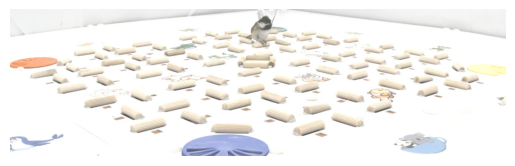

In [6]:
all_cams = np.array([np.stack(sublist) for sublist in all_cams])
print(np.shape(all_cams))  # (n_cams, h, w, 3, n_frames)

# show the first frame of the first camera
image_to_show = all_cams[0, :, :, :, 0]
plt.imshow(image_to_show)
plt.axis('off')
plt.show()

In [7]:
''' cropping params '''
face_w3d= 7 # scaling factor, IL: 0.06, XL: 80/20
face_crop_size=(128,128) # pixels

In [8]:
''' crop and resize frames '''
n_frames = all_scales.shape[0]
# shape (total_frames, ds_h, ds_w, n_cams, 3)
face_images = np.zeros([n_frames, face_crop_size[1], face_crop_size[0], n_cams, 3], dtype='uint8')
for n_cam in range(n_cams):
    images = np.transpose(all_cams[n_cam], axes=[3, 0, 1, 2])  # (n_frames, h, w, 3)
    scales = all_scales[:, n_cam]
    centroids = all_centroids[:, n_cam]
    for f in range(n_frames):
        if np.isfinite(centroids[f].sum()):
            full_image = images[f]
            head_ctr = np.maximum(centroids[f], 0) # rough x-y head coords as in comNet
            head_ctr[0] = np.min([head_ctr[0], full_image.shape[1]])
            head_ctr[1] = np.min([head_ctr[1], full_image.shape[0]])
            half_width = np.nanmax([np.round(face_w3d * scales[f]), 15]) # minimum 31px image for head
            crop_img, _, _ = crop_from_com(full_image, head_ctr, half_width, face_crop_size)
            face_images[f, :, :, n_cam, :] = crop_img

Frame: 49 Camera: 3
Centroid: [1093.02176692  128.85168119]
Scale: 2.2308396122279803
Head Center after adjustment: [1093.02176692  128.85168119]
Crop Image Shape: (128, 128, 3)
uint8


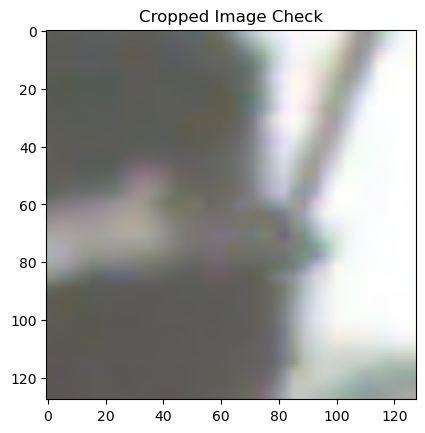

In [9]:
print("Frame:", f, "Camera:", n_cam)
print("Centroid:", centroids[f])
print("Scale:", scales[f])
print("Head Center after adjustment:", head_ctr)
print("Crop Image Shape:", crop_img.shape)
print(crop_img.dtype)
plt.imshow(face_images[0, :, :, 0, :])
plt.title("Cropped Image Check")
plt.show()

In [10]:
# only keep frames where head is labeled in all views
label_idx = []
for f in range(n_frames):
    if np.isfinite(np.sum(all_centroids[f])):
        label_idx.append(f)
face_images = face_images[np.asarray(label_idx)]

50

In [16]:
''' predict food class per view '''
# j5-xl-071926-zoom is a single-view model, so run each camera separately
print('\nreading and predicting...')
n_classes = len(class_names)
preds = np.zeros((np.shape(face_images)[0], n_cams, n_classes), dtype='float32')
for n_cam in range(n_cams):
    preds[:, n_cam, :] = faceNet.predict(face_images[:, :, :, n_cam, :], batch_size=200)
pred_class = np.argmax(preds, axis=-1)  # (n_labeled_frames, n_cams)[
print(preds.shape)


reading and predicting...
(50, 4, 3)


In [17]:
''' frame-level weighted consensus over views (as in createFaceDataset.ipynb) '''
# Per view i, from the 3-class softmax:
#   visibility  w_i = 1 - P(occluded)_i        -> occluded views abstain (weight ~0)
#   food-evid.  f_i = P(hasFood)_i / (P(hasFood)_i + P(noFood)_i)   (given view is clear)
# Frame decision:
#   carry_score = sum_i(w_i * f_i) / sum_i(w_i);   carrying if carry_score > CARRY_THRESH
#
# NOTE: this ratio is a convex combination, so it always lands in [min(f_i), max(f_i)]
# regardless of how small the weights are - shrinking every w_i by the same factor
# doesn't change the result, only their RELATIVE sizes do. That means a frame where
# every camera is mostly occluded can still produce a full-confidence-looking score,
# just driven by whichever view happens to be *least* occluded. sum(w_i) itself is
# the signal for "how much total evidence exists" - MIN_TOTAL_WEIGHT gates on that.
CARRY_THRESH = 0.5
MIN_TOTAL_WEIGHT = 1.0  # ~one fully-visible-equivalent view; below this, don't trust the score

n_labeled_frames = face_images.shape[0]
cls = list(class_names)
i_has, i_occ, i_no = cls.index('hasFood'), cls.index('occluded'), cls.index('noFood')

w_vis = 1.0 - preds[:, :, i_occ]                 # P(clear)                         # (n_frames, n_cams)
f_food = preds[:, :, i_has] / (preds[:, :, i_has] + preds[:, :, i_no] + 1e-9) # P(food | clear)

sum_w = w_vis.sum(axis=1)
carry_score = np.where(sum_w > 1e-6, (w_vis * f_food).sum(axis=1) / np.maximum(sum_w, 1e-9), np.nan)
reliable = sum_w >= MIN_TOTAL_WEIGHT
carrying = carry_score > CARRY_THRESH  # the raw call; only trust it where `reliable` is True

n_scorable = np.isfinite(carry_score).sum()
n_reliable = int(reliable.sum())
print(f'{n_labeled_frames} frames, {n_scorable} scorable (>=1 non-occluded view)')
print(f'  reliable (sum_w >= {MIN_TOTAL_WEIGHT}): {n_reliable}/{n_labeled_frames}')
print(f'  low-confidence (scorable but sum_w < {MIN_TOTAL_WEIGHT}): {n_scorable - n_reliable}/{n_labeled_frames}')
print(f'carrying @{CARRY_THRESH} among reliable frames: {int(np.sum(carrying & reliable))} / {n_reliable}')

50 frames, 50 scorable (>=1 non-occluded view)
  reliable (sum_w >= 1.0): 48/50
  low-confidence (scorable but sum_w < 1.0): 2/50
carrying @0.5 among reliable frames: 35 / 48


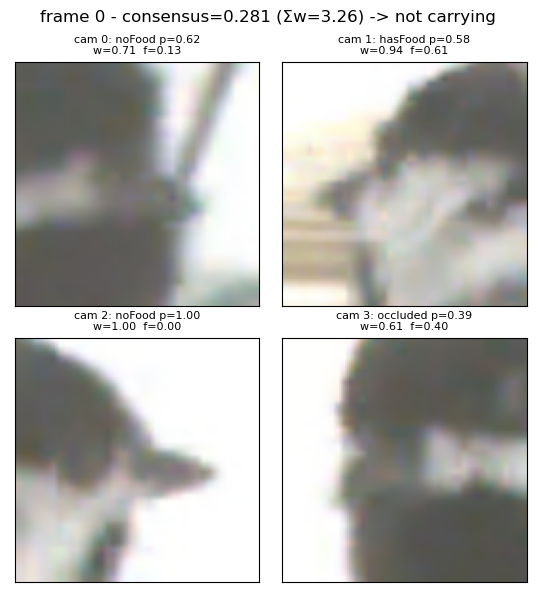

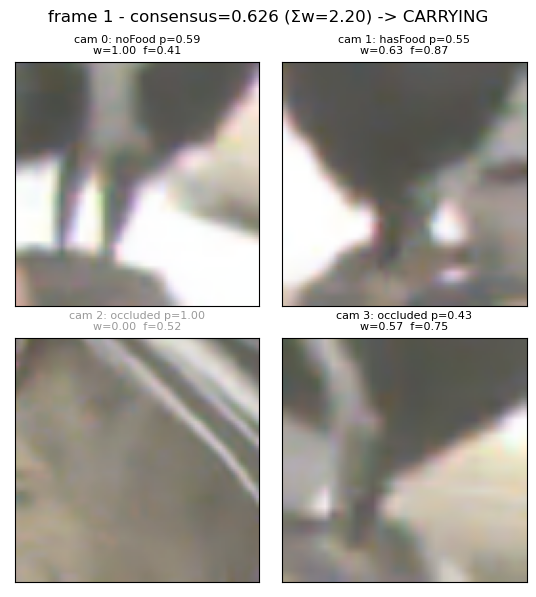

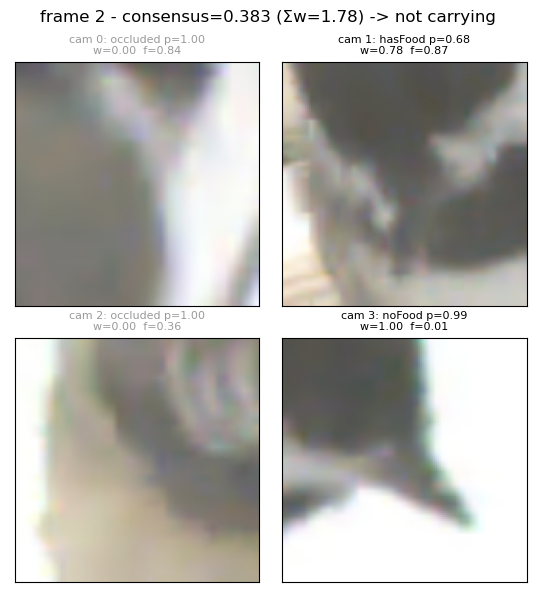

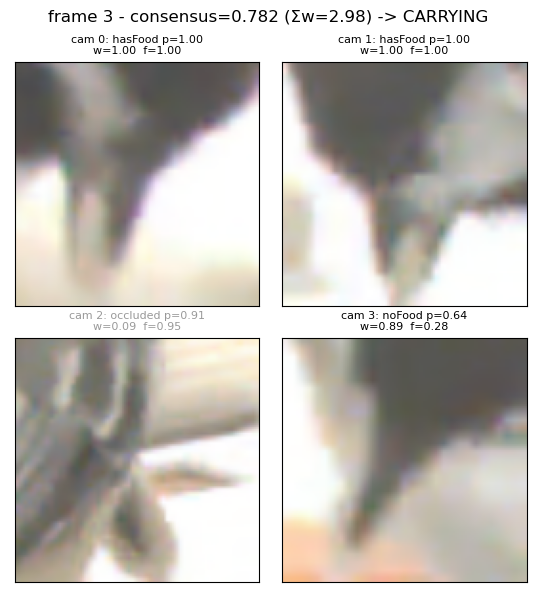

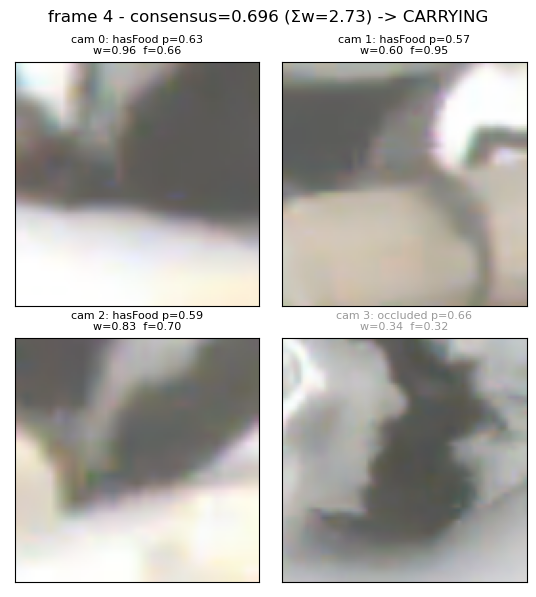

...

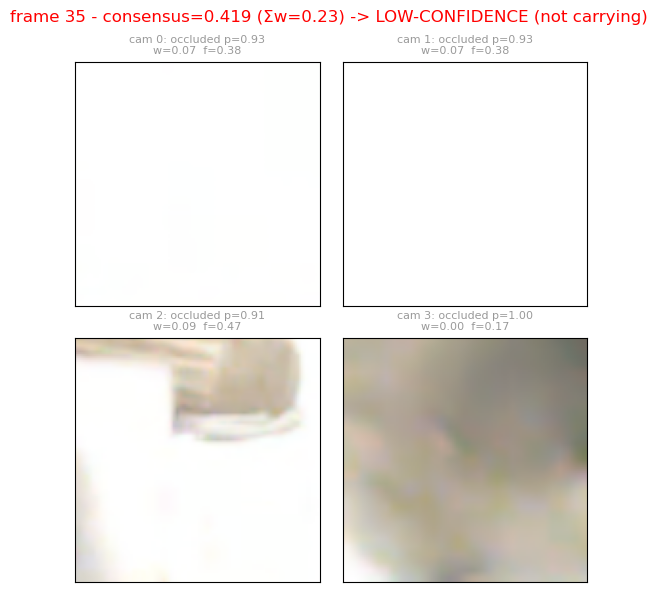

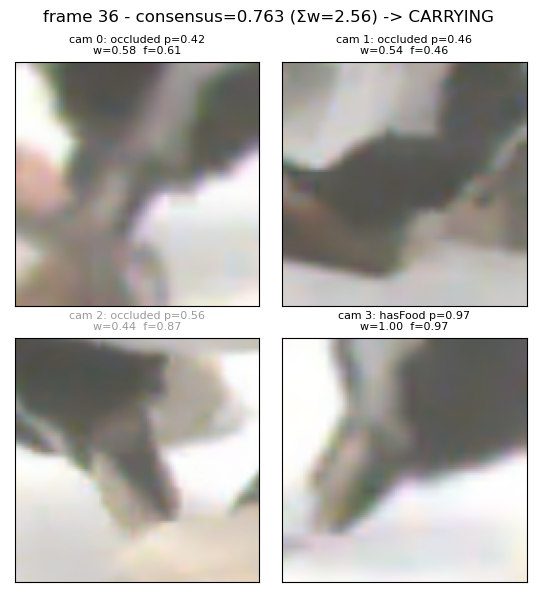

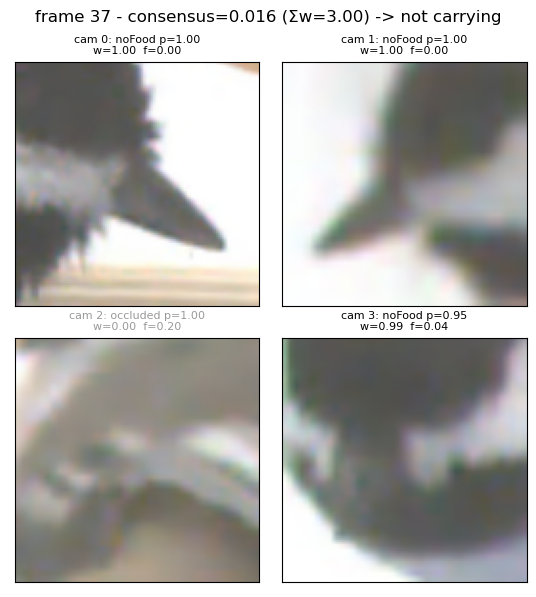

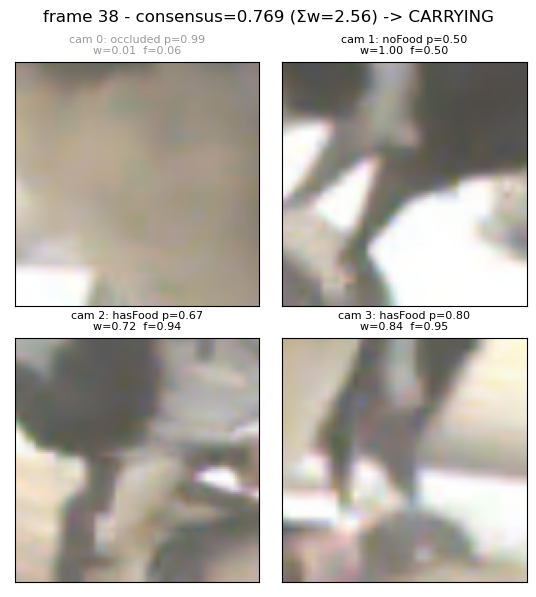

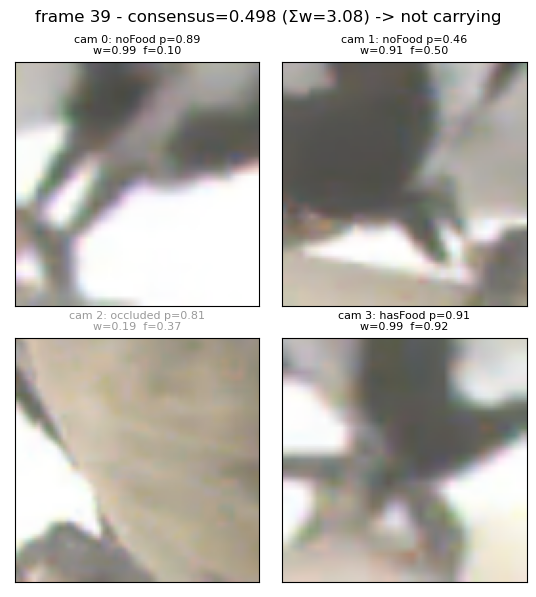

In [18]:
''' plot the specified frames to check output '''
# frames to inspect - edit this list, or use e.g.
# example_idx = np.random.randint(n_labeled_frames, size=10)
example_idx = np.arange(40)

for ex in example_idx:
    f, ax = plt.subplots(2, 2, figsize=(5.5, 6))
    for n_cam in range(n_cams):
        i, j = divmod(n_cam, 2)
        ax[i, j].imshow(face_images[ex, :, :, n_cam, :])
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])
        # predicted class + probability, and this view's contribution to the vote:
        # w = visibility weight, f = food evidence
        c = pred_class[ex, n_cam]
        # grey out views that barely count toward the consensus
        color = '0.6' if w_vis[ex, n_cam] < 0.5 else 'k'
        ax[i, j].set_title(f'cam {n_cam}: {class_names[c]} p={preds[ex, n_cam, c]:.2f}\n'
                           f'w={w_vis[ex, n_cam]:.2f}  f={f_food[ex, n_cam]:.2f}',
                           fontsize=8, color=color)

    decision = 'CARRYING' if carrying[ex] else 'not carrying'
    if not reliable[ex]:
        decision = f'LOW-CONFIDENCE ({decision})'
    title_color = 'r' if not reliable[ex] else 'k'
    f.suptitle(f'frame {ex} - consensus={carry_score[ex]:.3f} (Σw={sum_w[ex]:.2f}) -> {decision}',
               color=title_color)
    plt.tight_layout()
    plt.show()

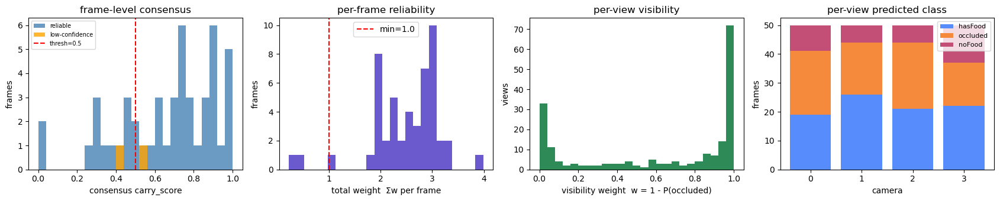

2 / 50 frames are low-confidence (Σw < 1.0)
per-camera disagreement with the frame consensus (reliable frames only):
  cam 0: 33.3% of frames
  cam 1: 39.6% of frames
  cam 2: 41.7% of frames
  cam 3: 35.4% of frames


In [19]:
''' summary of the consensus across all frames '''
f, ax = plt.subplots(1, 4, figsize=(17, 3.5))

# distribution of the frame-level consensus score, split by reliability
scorable = np.isfinite(carry_score)
ax[0].hist(carry_score[reliable], bins=25, range=(0, 1), color='steelblue', alpha=0.8, label='reliable')
ax[0].hist(carry_score[scorable & ~reliable], bins=25, range=(0, 1), color='orange', alpha=0.8, label='low-confidence')
ax[0].axvline(CARRY_THRESH, color='r', ls='--', label=f'thresh={CARRY_THRESH}')
ax[0].set_xlabel('consensus carry_score'); ax[0].set_ylabel('frames')
ax[0].set_title('frame-level consensus'); ax[0].legend(fontsize=7)

# total weight per frame - the reliability gate itself
ax[1].hist(sum_w, bins=25, color='slateblue')
ax[1].axvline(MIN_TOTAL_WEIGHT, color='r', ls='--', label=f'min={MIN_TOTAL_WEIGHT}')
ax[1].set_xlabel('total weight  Σw per frame'); ax[1].set_ylabel('frames')
ax[1].set_title('per-frame reliability'); ax[1].legend()

# how many views actually count per frame (visibility weights)
ax[2].hist(w_vis.ravel(), bins=25, range=(0, 1), color='seagreen')
ax[2].set_xlabel('visibility weight  w = 1 - P(occluded)'); ax[2].set_ylabel('views')
ax[2].set_title('per-view visibility')

# predicted class counts per camera
counts = np.stack([(pred_class == k).sum(axis=0) for k in range(n_classes)])  # (n_classes, n_cams)
bottom = np.zeros(n_cams)
for k in range(n_classes):
    ax[3].bar(np.arange(n_cams), counts[k], bottom=bottom, label=class_names[k])
    bottom += counts[k]
ax[3].set_xticks(np.arange(n_cams)); ax[3].set_xlabel('camera'); ax[3].set_ylabel('frames')
ax[3].set_title('per-view predicted class'); ax[3].legend(fontsize=8)

plt.tight_layout()
plt.show()

print(f'{int((~reliable).sum())} / {len(reliable)} frames are low-confidence (Σw < {MIN_TOTAL_WEIGHT})')

# how often a single view disagrees with the frame consensus (reliable frames only -
# a low-confidence frame's "consensus" isn't a fair thing to disagree with)
single_view_carry = (pred_class == i_has)
disagree = single_view_carry != carrying[:, None]
print('per-camera disagreement with the frame consensus (reliable frames only):')
for n_cam in range(n_cams):
    print(f'  cam {n_cam}: {disagree[reliable, n_cam].mean():.1%} of frames')